In [1]:
%matplotlib inline

import itertools
import numpy as np
import os
import random
import sys
import psutil
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
plt.switch_backend('agg')

if "./lib" not in sys.path:
    sys.path.append("./lib")
    
import plotting
from collections import deque, namedtuple
from readingFileEfficiently import *
import VOC2012_npz_files_writter
from DNN import *
from Agent import ObjLocaliser

/home/mohammad/Tensorflow/local/lib/python2.7/site-packages/requests/__init__.py:83: RequestsDependencyWarning: Old version of cryptography ([1, 2, 3]) may cause slowdown.
  warnings.warn(warning, RequestsDependencyWarning)


In [2]:
#This cell reads VOC 2012 dataset and save them in .npz files for future.
#The process of reading data and put them in prper format is time consuming so they are stored in a file.

xml_path = "../VOC2012/Annotations/*.xml"
destination = "../data/"

#It splits dataset to 80% for training and 20% validation.
if not (os.path.isfile(destination+"test_input.npz") or os.path.isfile(destination+"test_target.npz")):
    VOC2012_npz_files_writter.writting_files(xml_path, destination, percentage=0)
    print("Files are ready!!!")
else:
    print("Records are already prepared!!!")

Records are already prepared!!!


Instructions for updating:
Please switch to tf.train.get_global_step


/home/mohammad/Tensorflow/local/lib/python2.7/site-packages/tensorflow/python/ops/gradients_impl.py:100: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Loading model checkpoint /home/mohammad/active localization/oneObj_xImg/experiments/test/checkpoints/model...

INFO:tensorflow:Restoring parameters from /home/mohammad/active localization/oneObj_xImg/experiments/test/checkpoints/model
input file 1 is loading...
New image is being loaded: 2010_002425.jpg
Populating replay memory...

[0.         0.         0.         0.         0.         0.
 0.         0.147095   0.         0.         0.22358686]


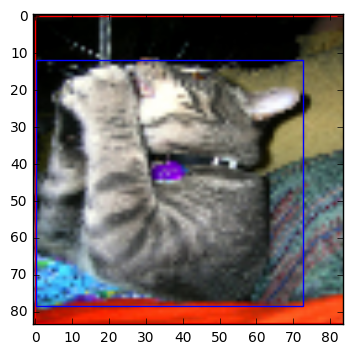

Step 0 (48) @ Episode 1/5, action 1, reward 1,loss: 1.20113563538
[0.         0.         0.         0.         0.         0.
 0.         0.14762434 0.         0.00291453 0.21365269]


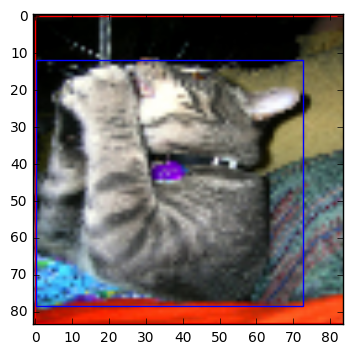

Step 1 (49) @ Episode 1/5, action 7, reward -1,loss: 0.951426684856
[0.         0.         0.         0.         0.         0.
 0.         0.1393063  0.         0.00193345 0.21804124]


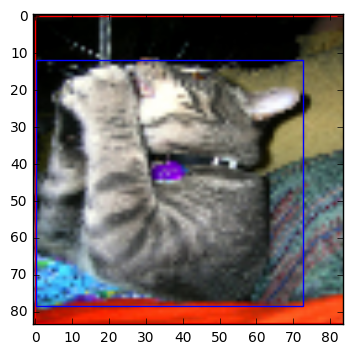

Step 2 (50) @ Episode 1/5, action 7, reward -1,loss: 2.39618372917
[0.         0.         0.         0.         0.         0.
 0.         0.14050296 0.         0.         0.2326086 ]


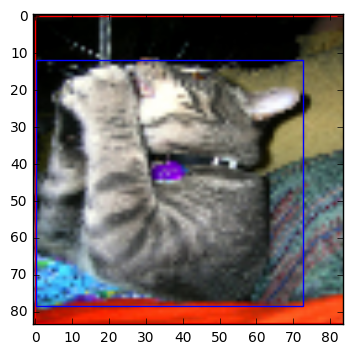

Step 3 (51) @ Episode 1/5, action 5, reward -1,loss: 1.46382594109
[0.         0.         0.         0.         0.         0.
 0.         0.13462335 0.         0.         0.23066758]


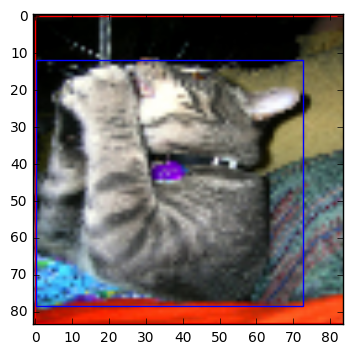

Step 4 (52) @ Episode 1/5, action 1, reward -1,loss: 1.72930717468
[0.         0.         0.         0.         0.         0.
 0.         0.13658518 0.         0.         0.22368117]


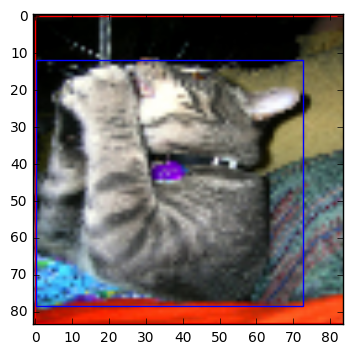

Step 5 (53) @ Episode 1/5, action 3, reward -1,loss: 1.15695357323
[0.         0.         0.         0.         0.         0.
 0.         0.13651729 0.         0.         0.2288616 ]


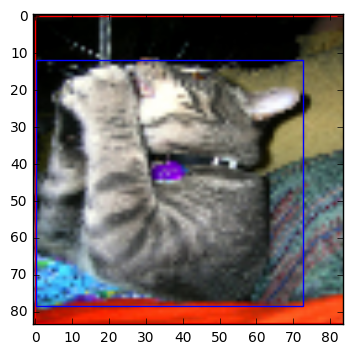

Step 6 (54) @ Episode 1/5, action 4, reward -1,loss: 1.44164001942
[0.         0.         0.         0.         0.         0.
 0.         0.13718626 0.         0.         0.22347057]


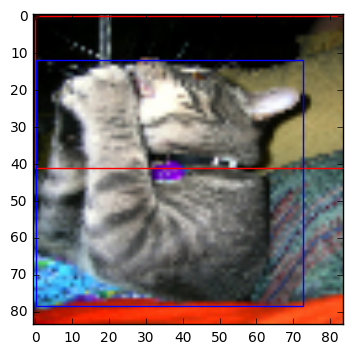

Step 7 (55) @ Episode 1/5, action 9, reward -1,loss: 1.68821656704
[0.         0.         0.         0.         0.         0.
 0.         0.23284824 0.         0.         0.20204116]


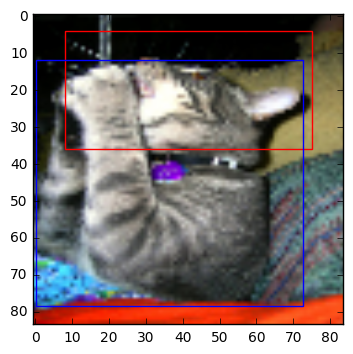

Step 8 (56) @ Episode 1/5, action 6, reward -1,loss: 1.68540489674
[0.02572379 0.         0.         0.         0.         0.
 0.         0.15254954 0.         0.         0.20355302]


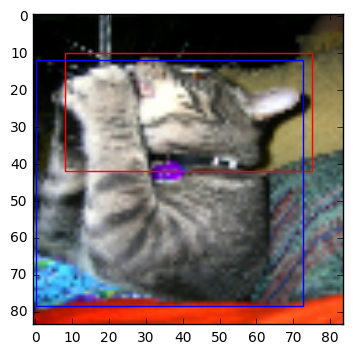

Step 9 (57) @ Episode 1/5, action 1, reward 1,loss: 1.76062572002
[0.08196074 0.         0.         0.         0.         0.
 0.00203697 0.12988573 0.         0.         0.05228848]


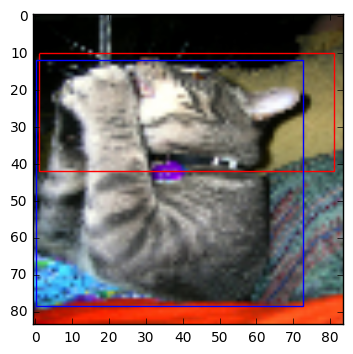

Step 10 (58) @ Episode 1/5, action 7, reward 1,loss: 1.69997143745
[0.05571821 0.         0.         0.         0.         0.
 0.         0.13272433 0.         0.         0.04898188]


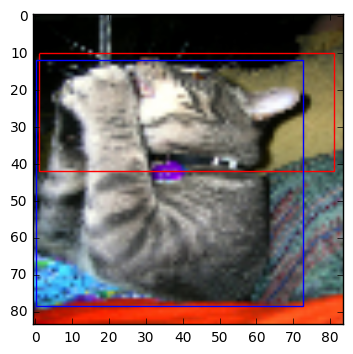

Step 11 (59) @ Episode 1/5, action 2, reward -1,loss: 1.42959702015
[0.07906258 0.         0.         0.         0.         0.
 0.         0.1730834  0.         0.         0.08936948]


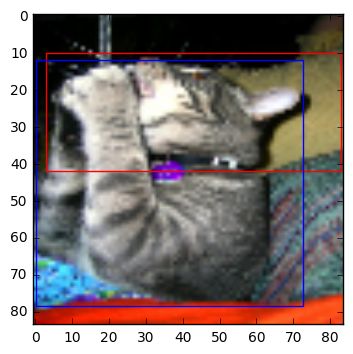

Step 12 (60) @ Episode 1/5, action 0, reward -1,loss: 0.9644510746
[0.04479783 0.         0.         0.         0.         0.
 0.         0.24621433 0.         0.         0.17906958]


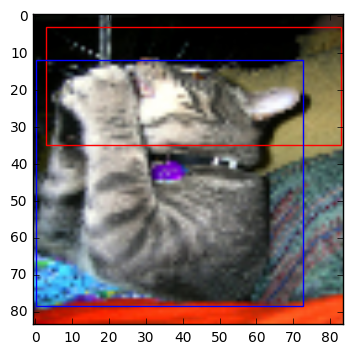

Step 13 (61) @ Episode 1/5, action 5, reward -1,loss: 2.29792380333
[0.05997776 0.         0.         0.         0.         0.
 0.         0.1679669  0.         0.         0.16510646]


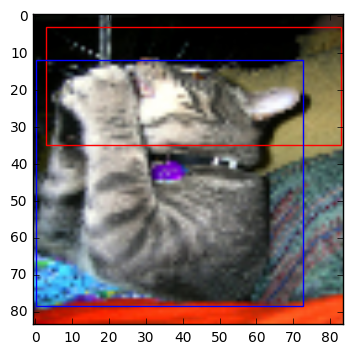

Step 14 (62) @ Episode 1/5, action 2, reward -1,loss: 1.23001277447
[0.1096787  0.         0.         0.         0.         0.
 0.         0.12786032 0.         0.         0.15318862]


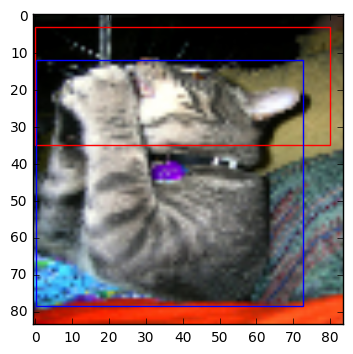

Step 15 (63) @ Episode 1/5, action 4, reward 1,loss: 1.50090110302
[0.1031687  0.         0.         0.         0.         0.
 0.         0.15416315 0.         0.         0.10754753]


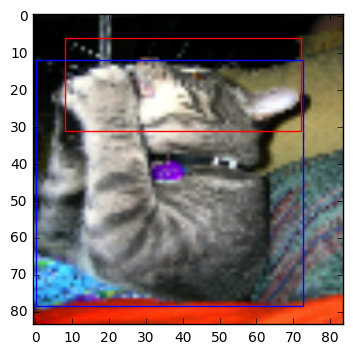

Step 16 (64) @ Episode 1/5, action 6, reward -1,loss: 0.958905875683
[0.0816612  0.02518307 0.         0.         0.         0.
 0.         0.17068052 0.         0.         0.06140402]


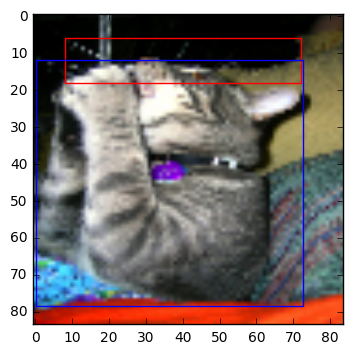

Step 17 (65) @ Episode 1/5, action 9, reward -1,loss: 1.48549723625
[0.0782207  0.00103214 0.         0.         0.         0.
 0.00654685 0.15476012 0.         0.         0.04560373]


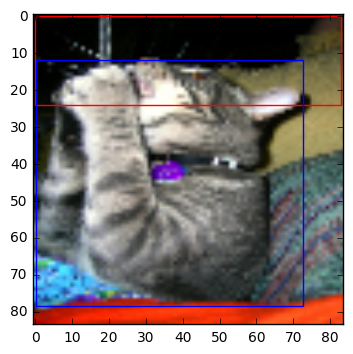

Step 18 (66) @ Episode 1/5, action 6, reward 1,loss: 1.19675159454
[0.09296496 0.02688136 0.         0.         0.         0.
 0.         0.1459106  0.         0.         0.0220521 ]


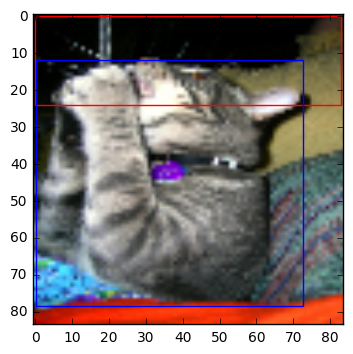

Step 19 (67) @ Episode 1/5, action 5, reward -1,loss: 1.75406956673
[0.06704906 0.02054472 0.         0.         0.         0.
 0.         0.14431055 0.         0.         0.        ]


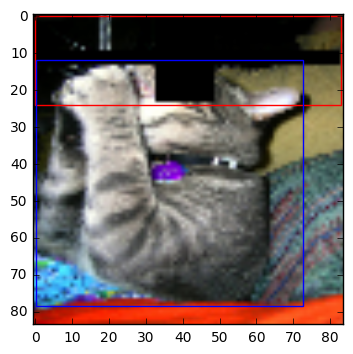

Step 20 (68) @ Episode 1/5, action 10, reward -3,loss: 1.47889876366
Episode Reward: -13 Episode Length: 21
[0.         0.         0.         0.         0.         0.
 0.         0.15160936 0.         0.01101571 0.18230361]


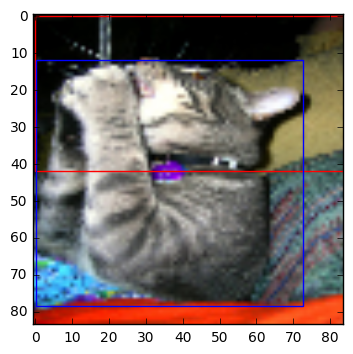

Step 0 (69) @ Episode 2/5, action 9, reward 1,loss: 1.20420026779
[0.         0.         0.         0.         0.         0.
 0.         0.23258688 0.         0.         0.13832603]


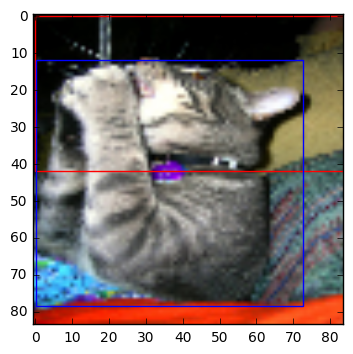

Step 1 (70) @ Episode 2/5, action 5, reward -1,loss: 1.21286702156
[0.         0.         0.         0.         0.         0.
 0.         0.15852667 0.         0.01925276 0.12907946]


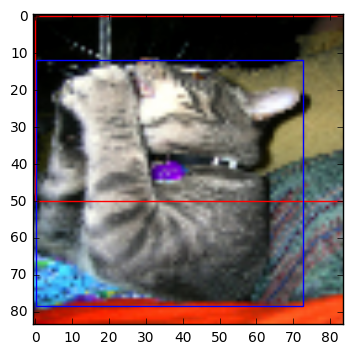

Step 2 (71) @ Episode 2/5, action 3, reward 1,loss: 1.4228553772
[0.         0.         0.         0.         0.         0.
 0.         0.11260229 0.         0.         0.02325379]


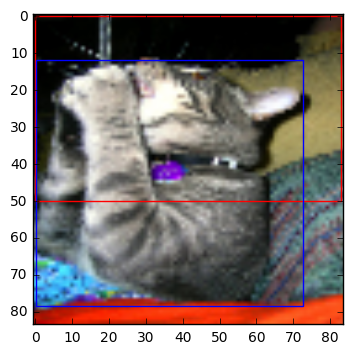

Step 3 (72) @ Episode 2/5, action 0, reward 1,loss: 1.65992712975
[0.03639628 0.         0.         0.         0.         0.
 0.         0.15619057 0.         0.         0.02055482]


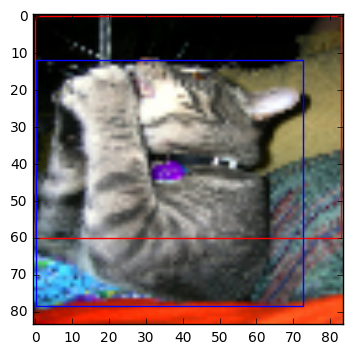

Step 4 (73) @ Episode 2/5, action 3, reward 1,loss: 2.05001521111
[0.09257756 0.         0.         0.         0.         0.
 0.         0.16834317 0.         0.         0.06662598]


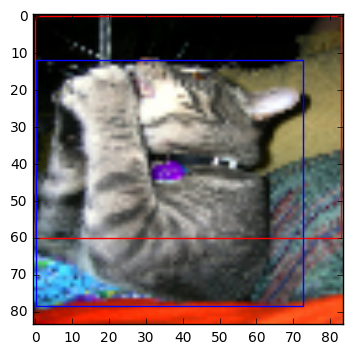

Step 5 (74) @ Episode 2/5, action 0, reward -1,loss: 1.2510715723
[0.01622707 0.         0.         0.         0.         0.
 0.         0.10551928 0.         0.         0.06222624]


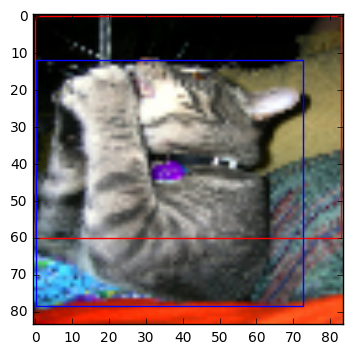

Step 6 (75) @ Episode 2/5, action 0, reward -1,loss: 1.4313608408
[0.         0.         0.         0.         0.         0.
 0.         0.12948795 0.         0.         0.06896589]


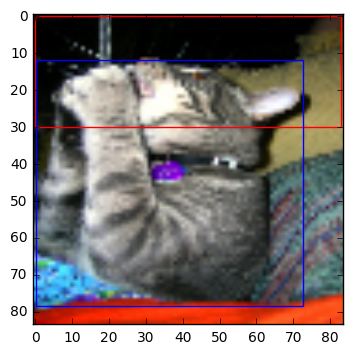

Step 7 (76) @ Episode 2/5, action 9, reward -1,loss: 0.966505289078
[0.01903677 0.02007385 0.         0.         0.         0.
 0.         0.11399476 0.         0.         0.16252485]


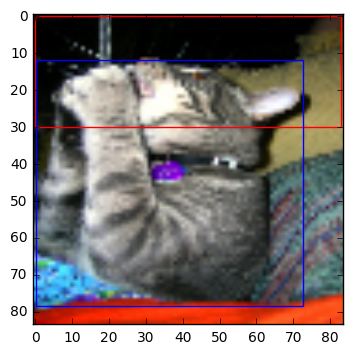

Step 8 (77) @ Episode 2/5, action 7, reward -1,loss: 2.18840146065
[0.06074222 0.0116898  0.         0.         0.         0.
 0.         0.07415826 0.         0.01761479 0.1320659 ]


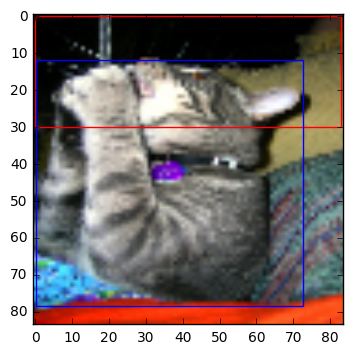

Step 9 (78) @ Episode 2/5, action 4, reward -1,loss: 2.23125600815
[0.07172092 0.04160148 0.         0.         0.         0.
 0.         0.10736763 0.         0.         0.08514038]


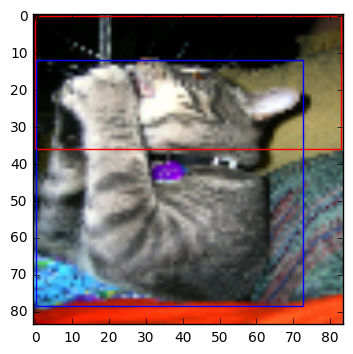

Step 10 (79) @ Episode 2/5, action 3, reward 1,loss: 1.92640006542
[0.08143365 0.05113611 0.         0.         0.         0.
 0.         0.12375802 0.01113541 0.         0.        ]


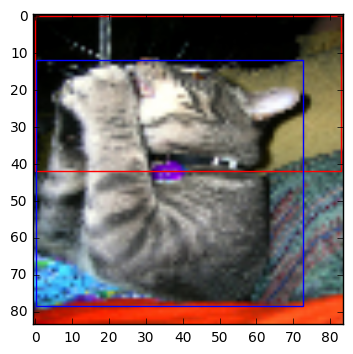

Step 11 (80) @ Episode 2/5, action 3, reward 1,loss: 1.6822218895
[0.06744654 0.04895417 0.         0.         0.         0.
 0.         0.13982418 0.01060661 0.         0.01687816]


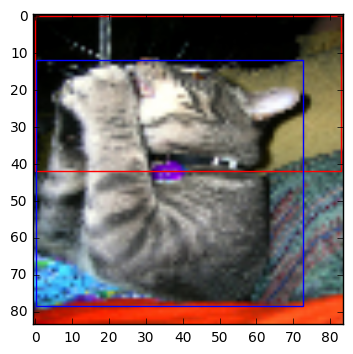

Step 12 (81) @ Episode 2/5, action 4, reward -1,loss: 1.47546327114
[0.05307091 0.         0.         0.         0.         0.
 0.         0.12890612 0.         0.         0.        ]


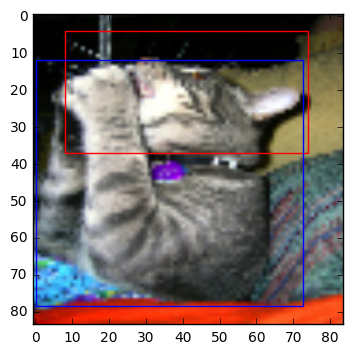

Step 13 (82) @ Episode 2/5, action 6, reward -1,loss: 1.45849275589
[0.04807815 0.         0.         0.         0.         0.
 0.         0.13137585 0.         0.         0.0274743 ]


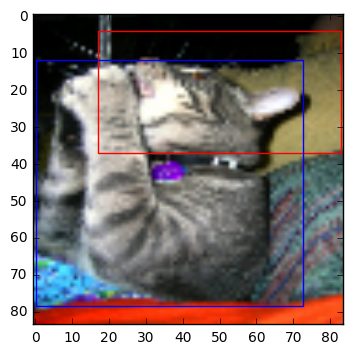

Step 14 (83) @ Episode 2/5, action 0, reward -1,loss: 1.75472772121
[0.06334665 0.         0.         0.         0.         0.
 0.         0.13362838 0.         0.         0.        ]


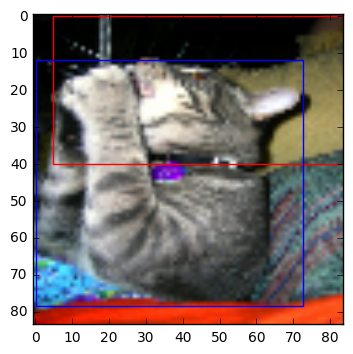

Step 15 (84) @ Episode 2/5, action 2, reward 1,loss: 1.48860645294
[0.02114344 0.         0.         0.         0.         0.
 0.         0.10633227 0.         0.         0.02333255]


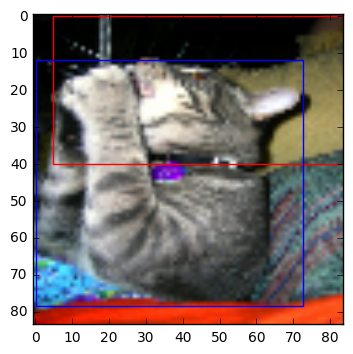

Step 16 (85) @ Episode 2/5, action 5, reward -1,loss: 1.24773383141
[0.04812732 0.         0.         0.         0.         0.
 0.         0.13941105 0.         0.         0.01106913]


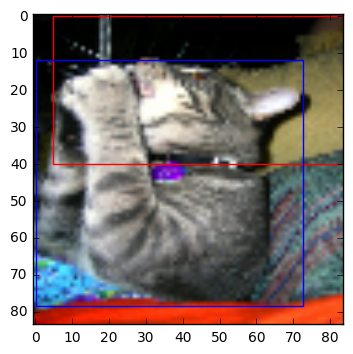

Step 17 (86) @ Episode 2/5, action 7, reward -1,loss: 1.74454975128
[0.0355074 0.        0.        0.        0.        0.        0.
 0.1812014 0.        0.        0.       ]


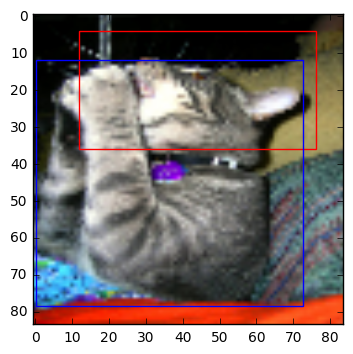

Step 18 (87) @ Episode 2/5, action 6, reward -1,loss: 0.945470333099
[0.05435182 0.         0.         0.         0.         0.
 0.         0.10579746 0.         0.         0.        ]


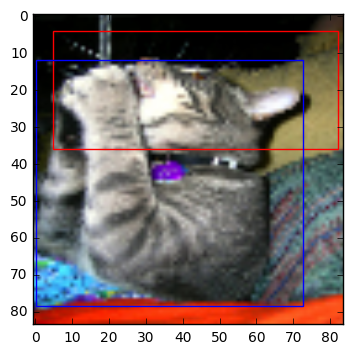

Step 19 (88) @ Episode 2/5, action 7, reward 1,loss: 0.918255448341
[0.04315229 0.         0.         0.         0.         0.
 0.         0.12100296 0.         0.         0.00277587]


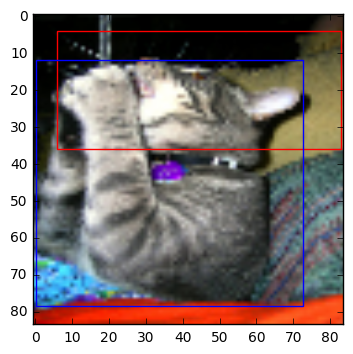

Step 20 (89) @ Episode 2/5, action 0, reward -1,loss: 1.67153024673
[0.06458771 0.         0.         0.         0.         0.
 0.         0.16084528 0.         0.         0.        ]


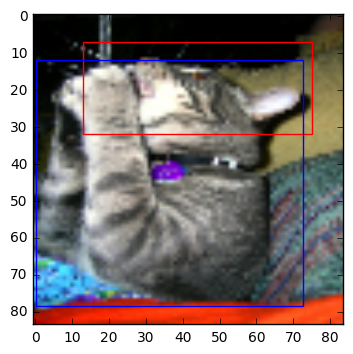

Step 21 (90) @ Episode 2/5, action 6, reward -1,loss: 1.5083129406
[0.03697555 0.         0.         0.         0.         0.
 0.         0.20838352 0.         0.         0.00754507]


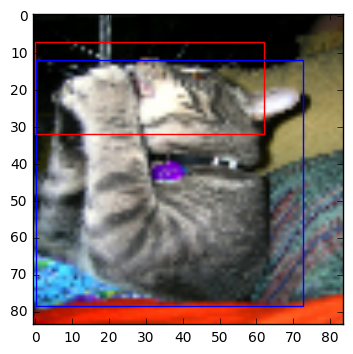

Step 22 (91) @ Episode 2/5, action 4, reward 1,loss: 2.75389003754
[0.01844419 0.02975347 0.         0.         0.         0.
 0.         0.12533803 0.         0.         0.02123281]


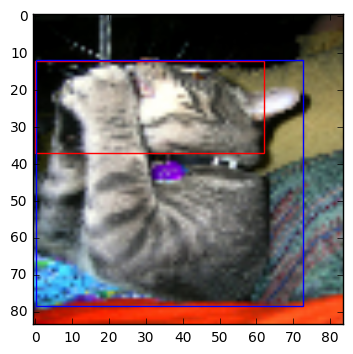

Step 23 (92) @ Episode 2/5, action 1, reward 1,loss: 1.56237673759
[0.03955973 0.00814128 0.         0.         0.         0.
 0.         0.07439257 0.         0.         0.04439367]


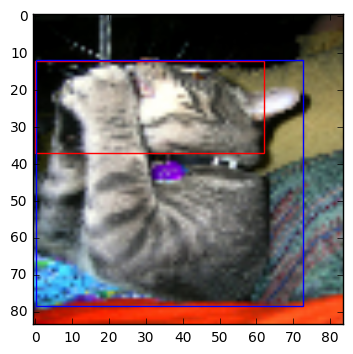

Step 24 (93) @ Episode 2/5, action 4, reward -1,loss: 1.67946112156
[0.03204374 0.02016001 0.         0.         0.         0.
 0.         0.1698772  0.         0.         0.0559556 ]


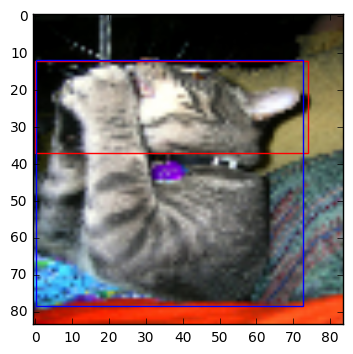

Step 25 (94) @ Episode 2/5, action 7, reward 1,loss: 1.23883903027
[0.00728431 0.02760609 0.         0.         0.         0.
 0.         0.11654434 0.         0.         0.07791919]


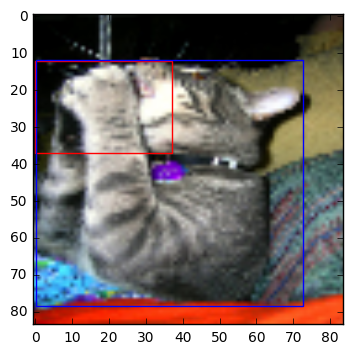

Step 26 (95) @ Episode 2/5, action 8, reward -1,loss: 1.22212278843
[0.         0.         0.         0.         0.         0.
 0.         0.1381579  0.00095067 0.         0.08253881]


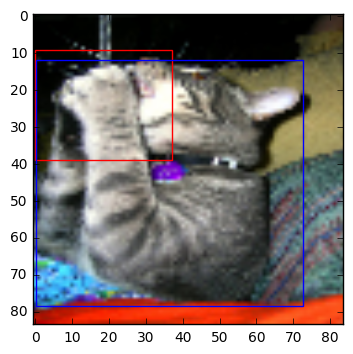

Step 27 (96) @ Episode 2/5, action 3, reward 1,loss: 1.44082856178
[0.         0.         0.         0.         0.         0.
 0.         0.09646436 0.         0.         0.0714628 ]


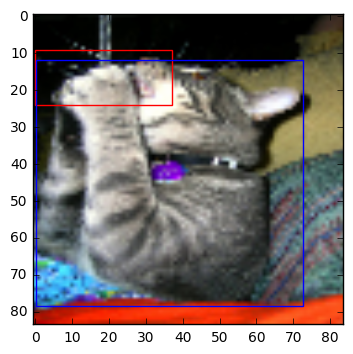

Step 28 (97) @ Episode 2/5, action 9, reward -1,loss: 1.22218549252
[0.         0.04031051 0.         0.         0.         0.
 0.         0.1295138  0.         0.         0.05571168]


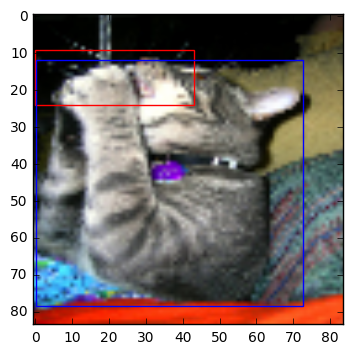

Step 29 (98) @ Episode 2/5, action 7, reward 1,loss: 0.971804738045
[0.         0.05997809 0.         0.         0.         0.
 0.         0.07669619 0.         0.         0.03872714]


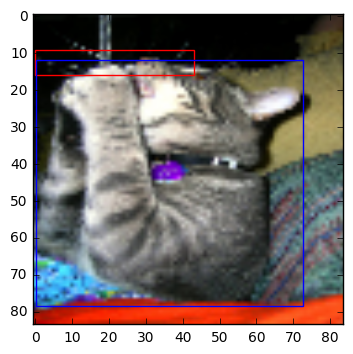

Step 30 (99) @ Episode 2/5, action 9, reward -1,loss: 1.6862552166
[0.         0.02650658 0.         0.         0.         0.
 0.         0.04483374 0.00057905 0.         0.03480765]


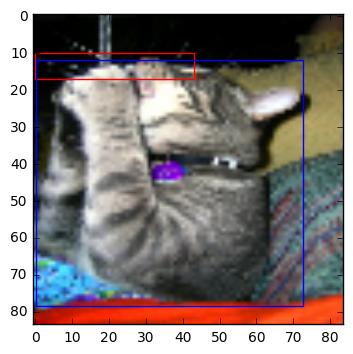

Step 31 (100) @ Episode 2/5, action 1, reward 1,loss: 1.47872424126
[0.         0.16263601 0.         0.         0.         0.
 0.         0.04860364 0.00490854 0.         0.00520088]


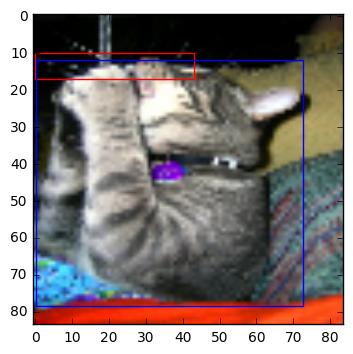

Step 32 (101) @ Episode 2/5, action 9, reward -1,loss: 1.1471016407
[0.         0.1625278  0.         0.         0.         0.
 0.         0.04507139 0.0025455  0.         0.        ]


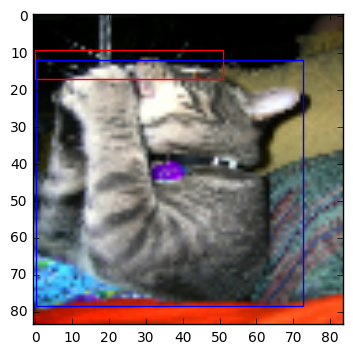

Step 33 (102) @ Episode 2/5, action 2, reward 1,loss: 1.20485639572
[0.00631509 0.12066501 0.         0.         0.         0.
 0.         0.         0.06722454 0.         0.        ]


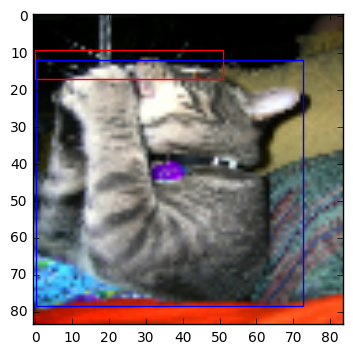

Step 34 (103) @ Episode 2/5, action 7, reward -1,loss: 1.21588754654
[0.01719554 0.09778179 0.         0.         0.         0.
 0.         0.02807299 0.04656496 0.         0.        ]


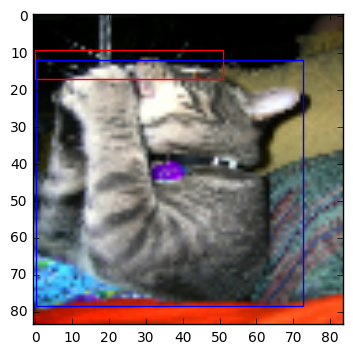

Step 35 (104) @ Episode 2/5, action 7, reward -1,loss: 1.51248240471
[0.00326354 0.10472996 0.         0.         0.         0.
 0.         0.03048374 0.04757229 0.         0.        ]


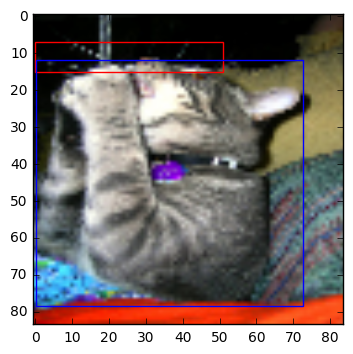

Step 36 (105) @ Episode 2/5, action 5, reward -1,loss: 1.67441225052
[0.01544156 0.06963997 0.         0.         0.         0.
 0.         0.03687362 0.01931507 0.         0.02608501]


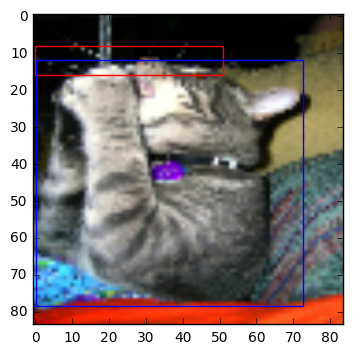

Step 37 (106) @ Episode 2/5, action 1, reward 1,loss: 1.24546158314
[0.01696637 0.08580758 0.         0.         0.         0.
 0.         0.05126433 0.03155319 0.         0.03459748]


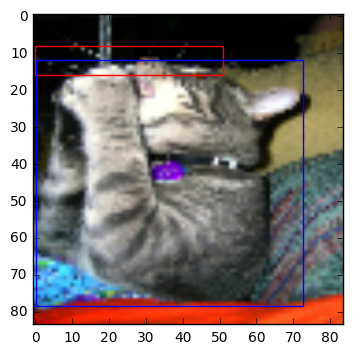

Step 38 (107) @ Episode 2/5, action 7, reward -1,loss: 1.23287034035
[0.0413909  0.10405017 0.         0.         0.         0.
 0.         0.03928037 0.01340254 0.         0.00564623]


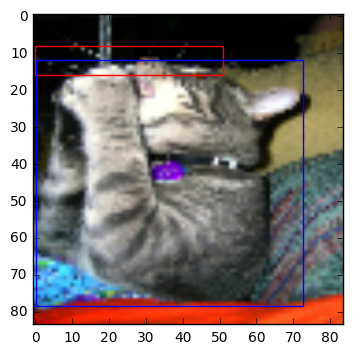

Step 39 (108) @ Episode 2/5, action 4, reward -1,loss: 1.67148947716
[2.351201e-03 7.906909e-02 0.000000e+00 0.000000e+00 0.000000e+00
 0.000000e+00 0.000000e+00 8.557760e-05 3.435634e-02 0.000000e+00
 0.000000e+00]


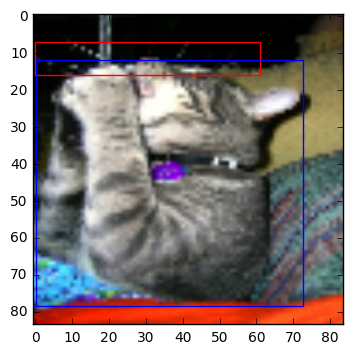

Step 40 (109) @ Episode 2/5, action 2, reward 1,loss: 1.03733229637
[0.         0.08294273 0.         0.         0.         0.
 0.         0.03798674 0.         0.         0.        ]


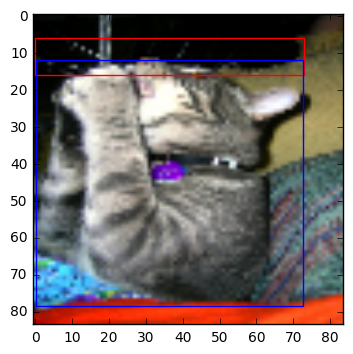

Step 41 (110) @ Episode 2/5, action 2, reward 1,loss: 1.75064086914
[0.         0.06764939 0.         0.         0.         0.
 0.         0.03877809 0.         0.         0.        ]


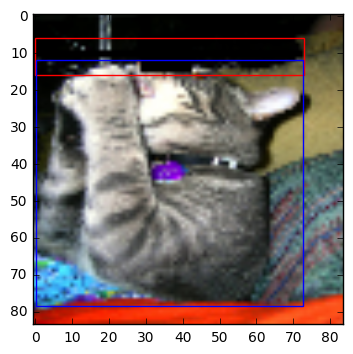

Step 42 (111) @ Episode 2/5, action 10, reward -3,loss: 1.14579796791
Episode Reward: -9 Episode Length: 43
[0.         0.         0.         0.         0.         0.
 0.         0.14962555 0.         0.00936141 0.16031103]


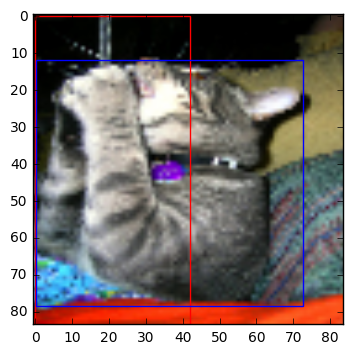

Step 0 (112) @ Episode 3/5, action 8, reward 1,loss: 1.94577050209
[0.         0.         0.         0.         0.         0.
 0.         0.14939448 0.         0.00669988 0.10846107]


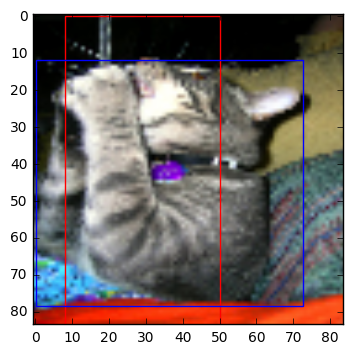

Step 1 (113) @ Episode 3/5, action 0, reward 1,loss: 1.71211445332
[0.         0.         0.         0.         0.         0.
 0.         0.14683601 0.         0.         0.1309163 ]


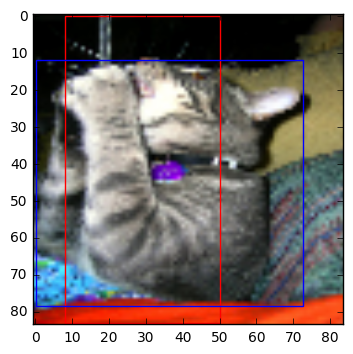

Step 2 (114) @ Episode 3/5, action 1, reward 1,loss: 1.4170820713
[0.         0.         0.         0.         0.         0.
 0.         0.15072113 0.         0.         0.08658827]


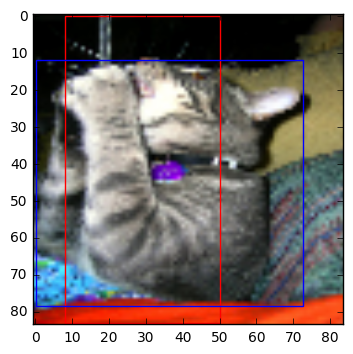

Step 3 (115) @ Episode 3/5, action 3, reward -1,loss: 0.953860282898
[0.         0.         0.         0.         0.         0.
 0.         0.07071625 0.         0.         0.0986018 ]


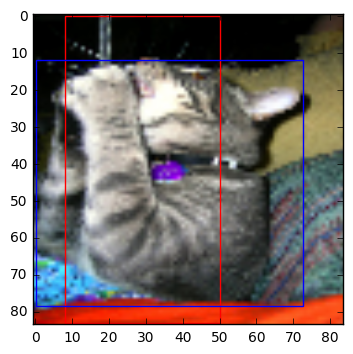

Step 4 (116) @ Episode 3/5, action 5, reward -1,loss: 1.6457221508
[0.         0.         0.         0.         0.         0.
 0.00575934 0.0640932  0.         0.         0.11241911]


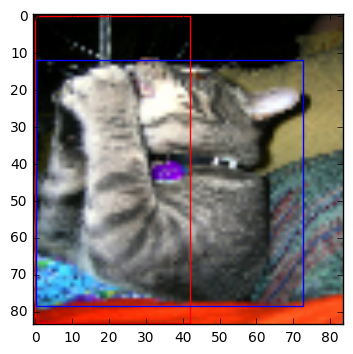

Step 5 (117) @ Episode 3/5, action 4, reward -1,loss: 1.7396569252
[0.         0.         0.         0.         0.         0.
 0.         0.0357203  0.         0.         0.07615912]


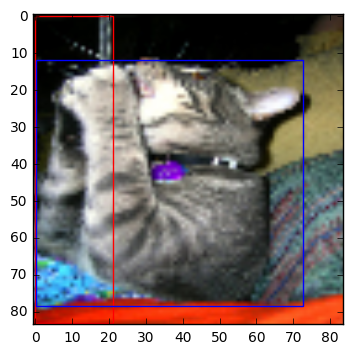

Step 6 (118) @ Episode 3/5, action 8, reward -1,loss: 1.45069897175
[0.         0.         0.         0.         0.         0.
 0.         0.08031825 0.         0.         0.08479783]


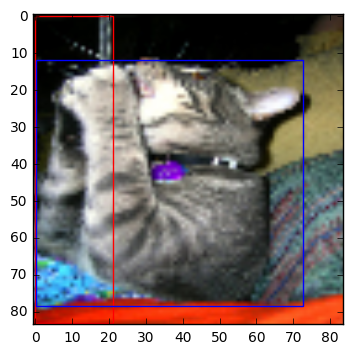

Step 7 (119) @ Episode 3/5, action 3, reward -1,loss: 1.22599983215
[0.         0.         0.         0.         0.         0.
 0.         0.1282476  0.         0.         0.04958148]


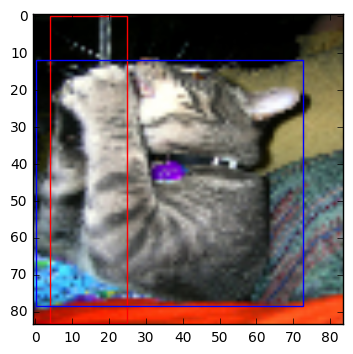

Step 8 (120) @ Episode 3/5, action 0, reward 1,loss: 0.966564893723
[0.         0.02804062 0.         0.         0.         0.
 0.         0.06300603 0.         0.         0.        ]


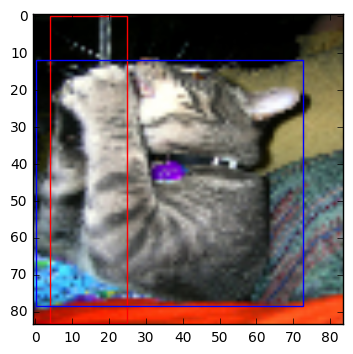

Step 9 (121) @ Episode 3/5, action 3, reward -1,loss: 1.46435117722
[0.         0.0035844  0.         0.         0.         0.
 0.         0.04930079 0.         0.         0.        ]


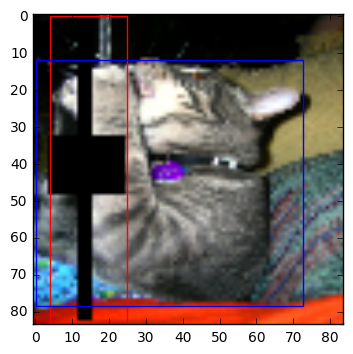

Step 10 (122) @ Episode 3/5, action 10, reward -3,loss: 1.40392506123
Episode Reward: -5 Episode Length: 11
[0.         0.         0.         0.         0.         0.
 0.         0.14195889 0.         0.02088033 0.16981018]


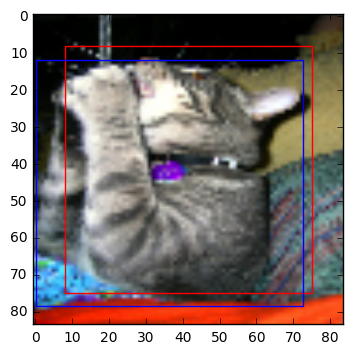

Step 0 (123) @ Episode 4/5, action 6, reward 1,loss: 1.7211534977
[0.         0.         0.         0.         0.         0.
 0.         0.16739514 0.         0.01172714 0.15894353]


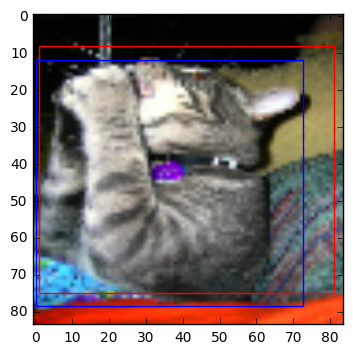

Step 1 (124) @ Episode 4/5, action 7, reward 1,loss: 1.43519818783
[0.         0.         0.         0.         0.         0.
 0.         0.17460234 0.         0.00954645 0.12920137]


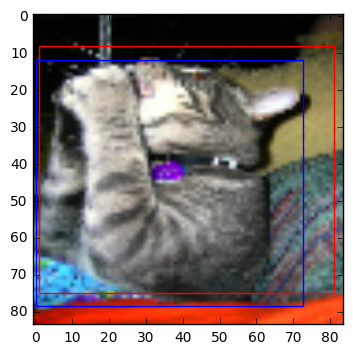

Step 2 (125) @ Episode 4/5, action 2, reward -1,loss: 2.01477432251
[0.         0.         0.         0.         0.         0.
 0.         0.15238807 0.         0.         0.09373146]


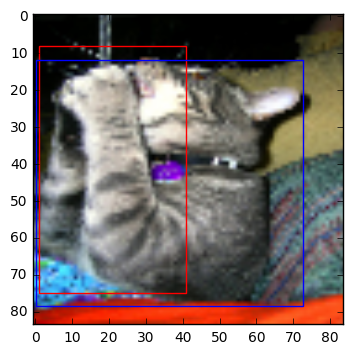

Step 3 (126) @ Episode 4/5, action 8, reward -1,loss: 1.4426574707
[0.         0.         0.         0.         0.         0.
 0.         0.14308518 0.         0.         0.11739375]


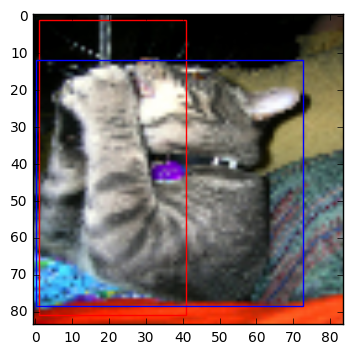

Step 4 (127) @ Episode 4/5, action 3, reward -1,loss: 1.55286216736
[0.         0.         0.         0.         0.         0.
 0.         0.16653559 0.         0.         0.05740817]


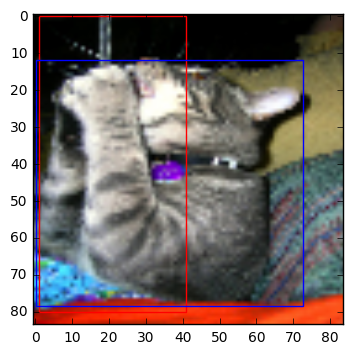

Step 5 (128) @ Episode 4/5, action 5, reward -1,loss: 1.25710630417
[0.         0.         0.         0.         0.         0.
 0.         0.16785306 0.         0.         0.04713921]


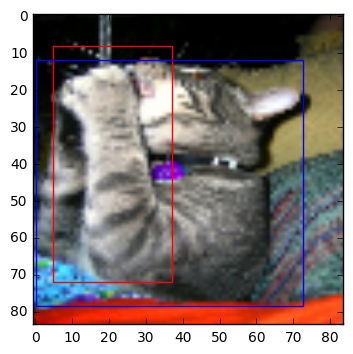

Step 6 (129) @ Episode 4/5, action 6, reward -1,loss: 1.67776036263
[0.         0.         0.         0.         0.         0.
 0.         0.14516366 0.         0.         0.05180739]


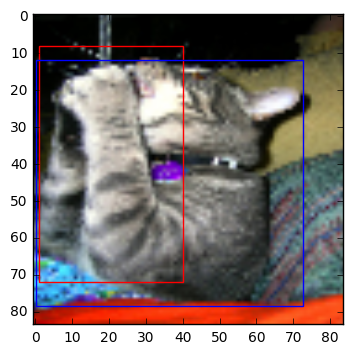

Step 7 (130) @ Episode 4/5, action 7, reward 1,loss: 2.19458293915
[0.         0.         0.         0.         0.         0.
 0.         0.13546988 0.         0.         0.06068674]


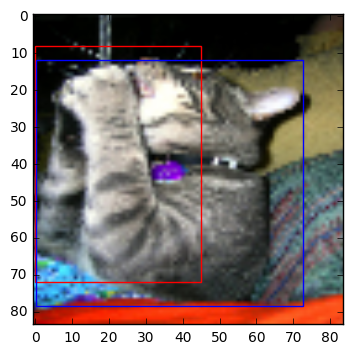

Step 8 (131) @ Episode 4/5, action 7, reward 1,loss: 1.97764515877
[0.         0.03460042 0.         0.         0.         0.
 0.         0.155381   0.         0.         0.03517212]


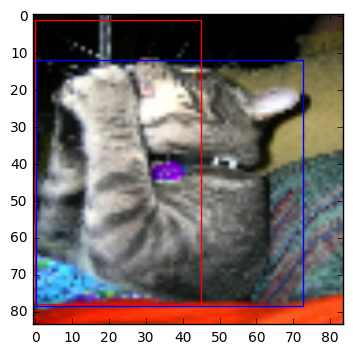

Step 9 (132) @ Episode 4/5, action 3, reward 1,loss: 1.17250192165
[0.         0.         0.         0.         0.         0.
 0.         0.13138473 0.         0.         0.04210183]


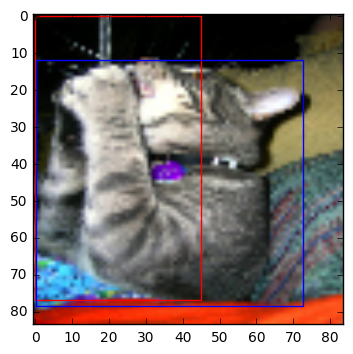

Step 10 (133) @ Episode 4/5, action 5, reward -1,loss: 1.16613733768
[0.         0.00866817 0.         0.         0.         0.
 0.         0.13917306 0.         0.         0.07230683]


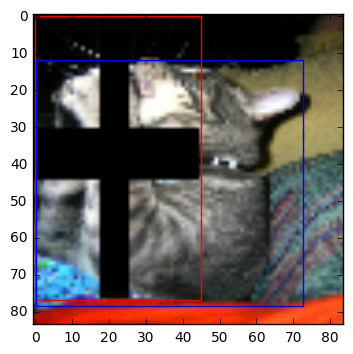

Step 11 (134) @ Episode 4/5, action 10, reward 3,loss: 1.16887056828
Episode Reward: 2 Episode Length: 12
[0.         0.         0.         0.         0.         0.
 0.         0.15584193 0.         0.01990965 0.1624585 ]


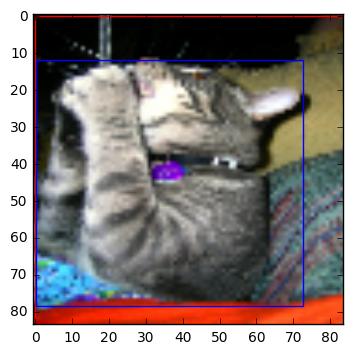

Step 0 (135) @ Episode 5/5, action 4, reward 1,loss: 1.88672482967
[0.         0.         0.         0.         0.         0.
 0.         0.15858509 0.         0.02437724 0.17974246]


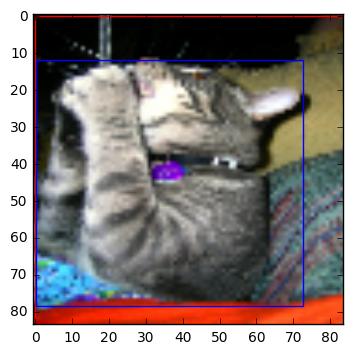

Step 1 (136) @ Episode 5/5, action 3, reward -1,loss: 1.72088634968
[0.         0.         0.         0.         0.         0.
 0.         0.15725866 0.         0.02642327 0.18760161]


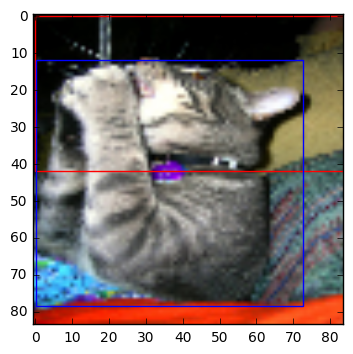

Step 2 (137) @ Episode 5/5, action 9, reward -1,loss: 0.900634407997
[0.         0.01758315 0.         0.         0.         0.
 0.         0.23509271 0.         0.00762958 0.13082   ]


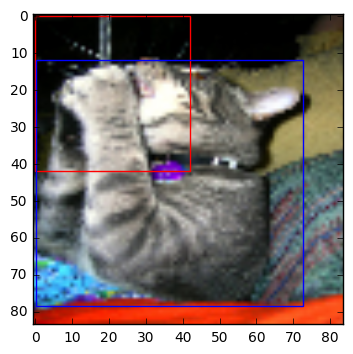

Step 3 (138) @ Episode 5/5, action 8, reward -1,loss: 1.17487180233
[0.         0.03220683 0.         0.         0.         0.
 0.         0.12181009 0.         0.02378765 0.11191402]


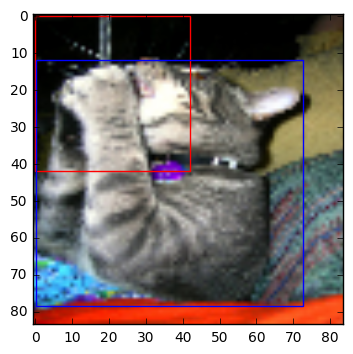

Step 4 (139) @ Episode 5/5, action 4, reward -1,loss: 1.49491500854
[0.         0.0862743  0.         0.         0.         0.
 0.         0.13291389 0.         0.03076836 0.01480735]


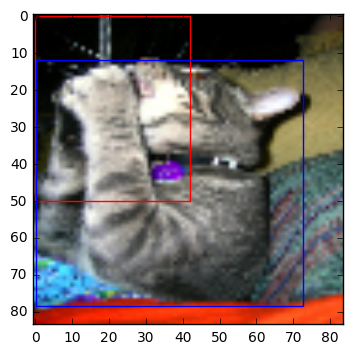

Step 5 (140) @ Episode 5/5, action 3, reward 1,loss: 1.19269168377
[0.01813656 0.13755533 0.         0.         0.         0.
 0.         0.14325356 0.         0.         0.00846815]


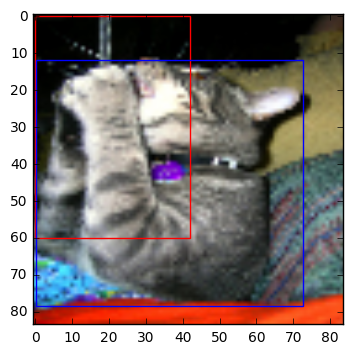

Step 6 (141) @ Episode 5/5, action 3, reward 1,loss: 2.78665018082
[0.         0.06442323 0.         0.         0.         0.
 0.         0.01644081 0.         0.         0.        ]


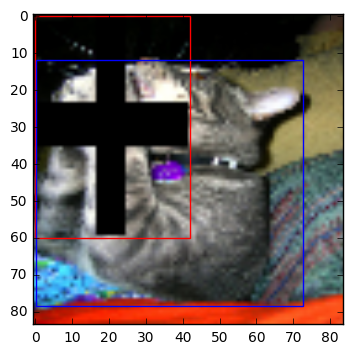

Step 7 (142) @ Episode 5/5, action 10, reward -3,loss: 1.44875335693
Episode Reward: -4 Episode Length: 8
number of correct located objects:1


In [3]:
num_episodes=5  #200     
replay_memory_size=500000    #2500   
replay_memory_init_size=500 #500  
update_target_estimator_every=10000 #100  
discount_factor=0.99
epsilon_start=1.0
epsilon_end=0.1
epsilon_decay_steps=500000 #10000  
batch_size=32
category = "cat"

#model_name = "defaul_DQL_architecture_epis{}_memorySize{}_UTE{}_EDS{}".format(num_episodes, replay_memory_size, update_target_estimator_every, epsilon_decay_steps)
model_name = "test"


tf.reset_default_graph()

# Where we save our checkpoints and graphs
experiment_dir = os.path.abspath("./experiments/{}".format(model_name))

# Create a glboal step variable
global_step = tf.Variable(0, name='global_step', trainable=False)
    
# Create estimators
q_estimator = Estimator(scope="q_estimator", summaries_dir=experiment_dir)
target_estimator = Estimator(scope="target_q")

# State processor
state_processor = StateProcessor()



done = False
elist = []
rlist = []


with tf.Session() as sess:
    sess.run(tf.global_variables_initializer()) 
    # Old API: sess.run(tf.initialize_all_variables())  
    Transition = namedtuple("Transition", ["state", "action", "reward", "next_state", "done"])

    # The replay memory
    replay_memory = []
    
    num_located = 0

    # Make model copier object
    estimator_copy = ModelParametersCopier(q_estimator, target_estimator)

    # Keeps track of useful statistics
    #stats = plotting.EpisodeStats(
        #episode_lengths=np.zeros(num_episodes),
        #episode_rewards=np.zeros(num_episodes))

    # For 'system/' summaries, usefull to check if currrent process looks healthy
    current_process = psutil.Process()

    # Create directories for checkpoints and summaries
    checkpoint_dir = os.path.join(experiment_dir, "checkpoints")
    checkpoint_path = os.path.join(checkpoint_dir, "model")
    report_path = os.path.join(experiment_dir, "report")

    if not os.path.exists(checkpoint_dir):
        os.makedirs(checkpoint_dir)
    if not os.path.exists(report_path):
        os.makedirs(report_path)
    f = open(report_path+"/log.txt", 'w')
    saver = tf.train.Saver()
    # Load a previous checkpoint if we find one
    latest_checkpoint = tf.train.latest_checkpoint(checkpoint_dir)
    if latest_checkpoint:
        print("Loading model checkpoint {}...\n".format(latest_checkpoint))
        saver.restore(sess, latest_checkpoint)

    # Get the current time step
    total_t = sess.run(tf.contrib.framework.get_global_step())
    #print "init:{}".format(total_t)

    # The epsilon decay schedule
    epsilons = np.linspace(epsilon_start, epsilon_end, epsilon_decay_steps)

    # The policy we're following
    policy = make_epsilon_greedy_policy(
        q_estimator,
        len(VALID_ACTIONS))
    episode_counter = 0
    #mybreak = 0
    
    for indx,tmp in enumerate(extractData(category, "train", batch_size)):

        #if mybreak > 5:
            #break
        
        img=tmp[0]
        target=tmp[1]

        im2 = Image.frombytes("RGB",(img['image_width'],img['image_height']),img['image'])
        env = ObjLocaliser(np.array(im2),target)
        print "New image is being loaded: {}".format(img['image_filename'])
        
        if len(replay_memory) < replay_memory_init_size:
            
            # Populate the replay memory with initial experience
            print("Populating replay memory...\n")

            env.Reset(np.array(im2))
            state = env.wrapping()


            state = state_processor.process(sess, state)
            state = np.stack([state] * 4, axis=2)

            for i in range(replay_memory_init_size):

                #env.Reset(np.array(im2))
                #state = env.wrapping()
                #state = state_processor.process(sess, state)
                #state = np.stack([state] * 4, axis=2)
                #action = 0
                #counter = 0
                #done = False

                #while (action != 10) or (counter < 50):

                action_probs, _ = policy(sess, state, epsilons[min(total_t, epsilon_decay_steps-1)])
                action = np.random.choice(np.arange(len(action_probs)), p=action_probs)

                #next_state, reward, done, _ = env.step(VALID_ACTIONS[action])
                reward = env.takingActions(VALID_ACTIONS[action])
                next_state = env.wrapping()

                if action == 10:
                    done = True
                else: 
                    done = False

                next_state = state_processor.process(sess, next_state)
                next_state = np.append(state[:,:,1:], np.expand_dims(next_state, 2), axis=2)
                replay_memory.append(Transition(state, action, reward, next_state, done))
                state = next_state

                #counter += 1

                if done:
                    #state = env.reset()
                    env.Reset(np.array(im2))
                    state = env.wrapping()
                    state = state_processor.process(sess, state)
                    state = np.stack([state] * 4, axis=2)
                else:
                    state = next_state 
            
            
            
    
        for i_episode in range(num_episodes):

            # Save the current checkpoint
            saver.save(tf.get_default_session(), checkpoint_path)

            # Reset the environment
            #state = env.reset()
            env.Reset(np.array(im2))
            state = env.wrapping()
            state = state_processor.process(sess, state)
            state = np.stack([state] * 4, axis=2)
            loss = None
            t=0
            action = 0
            e = 0
            r = 0
            #done = False
            # One step in the environment
            while (action != 10) and (t < 50):
                #print "hello22:{}".format(loss)
                #env.drawActions()
                # Epsilon for this time step
                epsilon = epsilons[min(total_t, epsilon_decay_steps-1)]

                # Maybe update the target estimator
                if total_t % update_target_estimator_every == 0:
                    estimator_copy.make(sess)
                    print("\nCopied model parameters to target network.")

                # Print out which step we're on, useful for debugging.
                #sys.stdout.flush()

                # Take a step
                #print epsilon
                action_probs, qs = policy(sess, state, epsilon)
                print qs
                action = np.random.choice(np.arange(len(action_probs)), p=action_probs)


                #next_state, reward, done, _ = env.step(VALID_ACTIONS[action])
                reward = env.takingActions(VALID_ACTIONS[action])
                env.drawActions()
                next_state = env.wrapping()
                if action == 10:
                    done = True
                else: 
                    done = False


                next_state = state_processor.process(sess, next_state)
                next_state = np.append(state[:,:,1:], np.expand_dims(next_state, 2), axis=2)

                # If our replay memory is full, pop the first element
                if len(replay_memory) == replay_memory_size:
                    replay_memory.pop(0)

                # Save transition to replay memory
                replay_memory.append(Transition(state, action, reward, next_state, done))   
                # Update statistics
                #stats.episode_rewards[i_episode] += reward
                #stats.episode_lengths[i_episode] = t

                # Sample a minibatch from the replay memory
                samples = random.sample(replay_memory, batch_size)
                states_batch, action_batch, reward_batch, next_states_batch, done_batch = map(np.array, zip(*samples))

                # Calculate q values and targets
                q_values_next = target_estimator.predict(sess, next_states_batch)
                targets_batch = reward_batch + np.invert(done_batch).astype(np.float32) * discount_factor * np.amax(q_values_next, axis=1)

                # Perform gradient descent update
                states_batch = np.array(states_batch)
                loss = q_estimator.update(sess, states_batch, action_batch, targets_batch)
                print("Step {} ({}) @ Episode {}/{}, action {}, reward {},loss: {}".format(t, total_t, i_episode + 1, num_episodes, action, reward, loss))
                f.write("Step {} ({}) @ Episode {}/{}, action {}, reward {},loss: {}\n".format(t, total_t, i_episode + 1, num_episodes, action, reward, loss))     


                # Counting number of correct localsied objects
                if reward == 3:
                    num_located += 1

                state = next_state
                t += 1
                total_t += 1
                e = e + loss
                r = r + reward
        
            episode_counter += 1

            # Add summaries to tensorboard
            episode_summary = tf.Summary()
            episode_summary.value.add(simple_value=epsilon, tag="episode/epsilon")
            episode_summary.value.add(simple_value=r, tag="episode/reward")
            episode_summary.value.add(simple_value=t, tag="episode/length")
            episode_summary.value.add(simple_value=current_process.cpu_percent(), tag="system/cpu_usage_percent")
            episode_summary.value.add(simple_value=current_process.memory_percent(), tag="system/v_memeory_usage_percent")
            q_estimator.summary_writer.add_summary(episode_summary, episode_counter)
            q_estimator.summary_writer.flush()

            #prin_stats = plotting.EpisodeStats(
                #episode_lengths=stats.episode_lengths[:i_episode+1],
                #episode_rewards=stats.episode_rewards[:i_episode+1])

            #print("Episode Reward: {} Episode Length: {}".format(prin_stats.episode_rewards[-1], prin_stats.episode_lengths[-1]))
            #f.write("Episode Reward: {} Episode Length: {}".format(prin_stats.episode_rewards[-1], prin_stats.episode_lengths[-1]))
            print("Episode Reward: {} Episode Length: {}".format(r, t))
            f.write("Episode Reward: {} Episode Length: {}".format(r, t))

            elist.append(float(e)/t)
            rlist.append(float(r)/t)
        break
        #mybreak += 1

        
f.close()
print "number of correct located objects:{}".format(num_located)

In [4]:
plt.xlabel("episods")
plt.ylabel("avg reward per epi")
plt.title("num of correct obj localisation:{0}".format(num_located))
plt.plot(rlist)
plt.savefig("./graphs/reward")
plt.close()

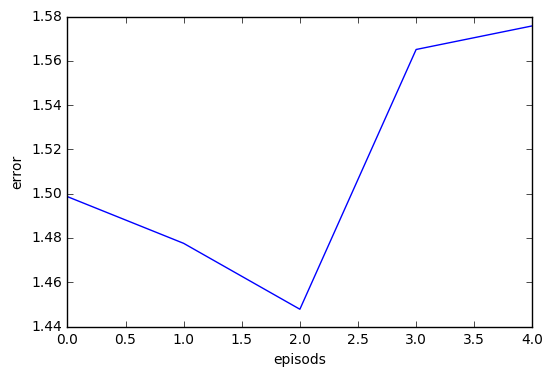

In [5]:
plt.xlabel("episods")
plt.ylabel("error")
plt.plot(elist)
plt.savefig("./graphs/error")

link to code: https://github.com/dennybritz/reinforcement-learning/blob/master/DQN/Deep%20Q%20Learning%20Solution.ipynb

https://www.oreilly.com/ideas/reinforcement-learning-with-tensorflow